In [1]:
import sys
sys.path.insert(0, '../../')
import torch
import torch.nn as nn
import torch.nn.functional as F
from src.utils import *
from src.dspn import *
from src.model import *
from data.MnistSet import *
from time import sleep
from tqdm import tqdm
from torch.utils.data import DataLoader, Dataset, TensorDataset
from data .Modelnet10toSet import *
from data .pointcloud_utils import *
from torch.utils.data import DataLoader, Dataset, TensorDataset
from data .Modelnet10toSet import *
from data .pointcloud_utils import *
import matplotlib.pyplot as plt
import random
import matplotlib.pyplot as plt
import random
from src.utils import *
from src.model import *
from data.MnistSet import *
from time import sleep
from tqdm import tqdm

In [2]:
!pwd
%cd ..
%cd ..
%cd visualisation

/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI/Tutorials/DeepSets  PointCloud
/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI/Tutorials
/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI
/Users/ahmedbegga/Desktop/TFG-Ahmed/SetXAI/visualisation


In [3]:
train_data = PointCloudData()
test_data = PointCloudData(None, Train=False, folder='test', transform=None)
train_loader = DataLoader(train_data, batch_size=32,shuffle=True)
test_loader = DataLoader(test_data, batch_size=32,shuffle=True)

In [4]:
dataset = PointCloudData()
class_names =   [ 'bathtub' , 'bed' , 'chair',  'desk' , 'dresser' , 'monitor' , 'night_stand' , 'sofa' ,  'table' ,  'toilet']
class_names2 = [torch.Tensor(0),torch.Tensor(1),torch.Tensor(2),torch.Tensor(0),torch.Tensor(3),torch.Tensor(4),torch.Tensor(5),torch.Tensor(6),torch.Tensor(7),torch.Tensor(8),torch.Tensor(9)]
sampleSet = []
sampleSetDSPN = []
sampleMaskDSPN = []
for i in range(0,len(class_names)):
    for j in range(0,len(dataset)):
        if i == dataset[j]['category']:
            sampleSet.append(dataset[j]['pointcloud'])
            sampleSetDSPN.append(dataset[j]['pointcloud'].unsqueeze(0))
            sampleMaskDSPN.append(dataset[j]['mask'].unsqueeze(0))
            break

Tamaño del dataset:  3991
Numero de elementos por muestra:  3 que se corresponde con la etiqueta, el conjunto de puntos y la mascara
Tamaño del conjunto de puntos:  (3, 2048)
Representación del conjunto de puntos: 


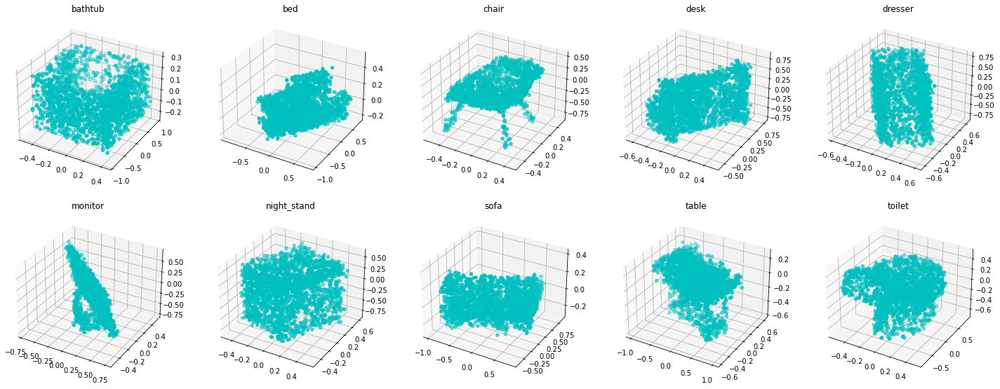

In [5]:
print('Tamaño del dataset: ',len(dataset))
print('Numero de elementos por muestra: ',len(dataset[0]),'que se corresponde con la etiqueta, el conjunto de puntos y la mascara')
print('Tamaño del conjunto de puntos: ',dataset[0]['pointcloud'].numpy().shape)
print('Representación del conjunto de puntos: ')
fig = plt.figure(figsize=(25, 25))
for i in range(10):
    ax = fig.add_subplot(5,5,i+1, projection='3d')
    s = sampleSet[i]
    # plot a 3D surface like in the example mplot3d/surface3d_demo
    surf = ax.scatter(s[0,:].numpy(), s[1,:].numpy(), s[2, :].numpy(),color='c',marker='o',s=20)
    plt.title(class_names[i])
    # ==============

In [6]:
class Net(nn.Module):
    def __init__(self, set_encoder, set_decoder, input_encoder=None):
        """
        In the auto-encoder setting, don't pass an input_encoder because the target set and mask is
        assumed to be the input.
        In the general prediction setting, must pass all three.
        """
        super().__init__()
        self.set_encoder = set_encoder
        self.input_encoder = input_encoder
        self.set_decoder = set_decoder

    def forward(self, input, target_set, target_mask):
        if self.input_encoder is None:
            # auto-encoder, ignore input and use target set and mask as input instead
            latent_repr = self.set_encoder(target_set, target_mask)
            target_repr = latent_repr
        else:
            # set prediction, use proper input_encoder
            latent_repr = self.input_encoder(input)
            # note that target repr is only used for loss computation in training
            # during inference, knowledge about the target is not needed
            target_repr = self.set_encoder(target_set, target_mask)

        predicted_set = self.set_decoder(latent_repr)

        return predicted_set, (target_repr, latent_repr)

In [7]:
set_channels = 3
set_size = 2048
hidden_dim = 128
iters = 10
latent_dim = 64
lr = 0.001
iters = 10
inner_lr = 800
n_epochs = 50
set_encoder = FSEncoderDSPN(set_channels, latent_dim, hidden_dim)
set_decoder = DSPN(set_encoder, set_channels, set_size, hidden_dim, iters, inner_lr)
net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
model1 = net.set_decoder.encoder

In [8]:
m = torch.ones(1,2048)
m.shape
print(net.set_decoder.encoder(sampleSet[9].unsqueeze(0),m))
net.set_decoder.encoder.salidaConv.shape

tensor([[-4.2735e-02,  2.8190e-03, -8.4727e-03, -3.4470e-02, -2.4345e-03,
          1.9195e-02,  7.1846e-03,  1.3347e-02,  7.4398e-03,  3.1670e-03,
          9.9200e-04, -1.3793e-02,  1.0265e-03, -1.9001e-03,  1.8258e-02,
         -5.0665e-03, -1.5006e-02, -4.0765e-03, -6.3683e-03, -1.4795e-02,
         -2.8979e-02, -3.4465e-02, -3.2154e-03, -3.7752e-03,  3.4088e-03,
          3.5479e-03,  2.4692e-02,  6.7614e-03, -9.6939e-04,  1.1540e-02,
          2.0674e-03, -6.1229e-04, -9.4546e-03,  6.3233e-03,  2.7368e-02,
          2.4136e-02,  1.0669e-02,  1.8107e-03,  5.2602e-05,  1.1166e-02,
         -8.8743e-03,  4.3879e-03,  4.4068e-03, -1.3973e-02,  6.9593e-03,
         -1.5303e-03, -8.3152e-03,  9.1092e-03, -4.9894e-03,  5.9664e-03,
          4.1511e-03,  2.2221e-02, -4.6085e-03, -3.9259e-04,  1.9900e-02,
         -5.5875e-03,  9.5193e-04, -2.1166e-03, -6.7644e-03, -4.7351e-03,
          5.0468e-02, -3.3637e-02, -2.0993e-02, -2.8553e-02]],
       grad_fn=<SumBackward1>)


torch.Size([1, 64, 2048])

In [9]:
def critical_points_MaxEncoder(model1, sample):
    critical_points_y = []
    critical_points_x = []
    critical_points_z = []
    #Salida de la capa de convoluciones
    #print(sample.shape)
    #m = torch.ones(1,1024)
    #print(m.shape)
    pred = model1(sample,m)
    features_map = model1.salidaConv.squeeze(0)
    #print(features_map.shape)
    #print(features_map.shape)
    #Aplicamos la operación invariante max
    xmax = features_map.max(axis=1)[0]
    #print(xmax.shape)
    #print(xmax.shape)
    xmaxargs = features_map.argmax(axis=1)
    #No nos quedamos con las coordenadas repetidas
    newxmaxargs = np.unique(xmaxargs)
    print(newxmaxargs.shape)
    points = sample.squeeze(0).numpy()
    #print(points.shape)
    '''
    critical = np.zeros(342)
    for f in range(32):
        for p in range(342):
            if features_map[f,p] == xmax[f]:
                critical[p] =critical[p]+1
    sorted_critical = np.sort(-critical)
    sorted_critical_args = -np.argsort(-critical)
    print(sorted_critical_args*-1)
    '''
    for k in range(len(newxmaxargs)):
        critical_points_y.append(points[0,newxmaxargs[k]])
        critical_points_x.append(points[1,newxmaxargs[k]])
        critical_points_z.append(points[2,newxmaxargs[k]])
    x = np.array(critical_points_x)
    y = np.array(critical_points_y)
    z = np.array(critical_points_z)
    s = np.stack((y,x,z))
    #print(s.shape)
    return s 

In [10]:
import plotly.graph_objects as go
import numpy as np

a = sampleSet[9].unsqueeze(0)
crit = critical_points_MaxEncoder(model1,a)
print(crit.shape)
fig = go.Figure()

fig.add_trace(go.Scatter3d(x=sampleSet[9][0], y=sampleSet[9][1], z=sampleSet[9][2],
                                   marker=dict(size=5,
                      line=dict(width=1,
                      color='navy')),
                                   mode='markers'))
fig.add_trace(go.Scatter3d(x=crit[0], y=crit[1], z=crit[2],
                                  marker=dict(size=5,
                      line=dict(width=3,
                      color='#d62728')),
                                   mode='markers'))
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

(49,)
(3, 49)


In [11]:
global_crit = 0
def plot_inner_loop(progress_only):
    a = sampleSet[2].numpy()
    crit = critical_points_MaxEncoder(model1,progress_only)
    #print(crit.shape)
    fig = go.Figure()
    progress_only = progress_only.squeeze(0).detach().numpy()
    fig.add_trace(go.Scatter3d(x=progress_only[0], y=progress_only[1], z=progress_only[2],
                                       marker=dict(size=5,
                          line=dict(width=1,
                          color='navy')),
                                       mode='markers'))
    fig.add_trace(go.Scatter3d(x=crit[0], y=crit[1], z=crit[2],
                                      marker=dict(size=5,
                          line=dict(width=3,
                          color='#d62728')),
                                       mode='markers'))
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [12]:
def plot_inner_loop_not_crit(progress_only):
    #a = sampleSet[3].numpy()
    progress_only = progress_only.squeeze(0).detach().numpy()
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(x=progress_only[0], y=progress_only[1], z=progress_only[2],
                                       marker=dict(size=5,
                          line=dict(width=1,
                          color='navy')),
                                       mode='markers'))
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [13]:
optimizer = torch.optim.Adam(
[p for p in net.parameters() if p.requires_grad], lr=0.02)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Traning using ',device)
net.train()
print(net)
criticos = []
mask = torch.ones(342).float().unsqueeze(0)
#plotProgressCrit()
for epoch in range(100):
    #for  i, sample in enumerate(test_loader):
    model1 = net.set_decoder.encoder
    label = class_names2[2].unsqueeze(0)
    set = sampleSetDSPN[2]
    target_mask = sampleMaskDSPN[2]
    (progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
    #criticos.append(critical_points_MaxEncoder(net.set_decoder.encoder.salidaConv,sampleSet[i]))
    progress_only = progress
    set = torch.cat([set, target_mask.unsqueeze(dim=1)], dim=1)
    progress = [torch.cat([p, m.unsqueeze(dim=1)], dim=1)
                    for p, m in zip(progress, masks)]
    set_loss = chamfer_loss(torch.stack(progress), set.unsqueeze(0))
    repr_loss = F.smooth_l1_loss(y_enc, y_label)
    #print("ojoo",repr_loss.item())
    loss = set_loss.mean() +  repr_loss.mean()
    print("loss: ",round(loss.item(),5))
    progress = progress_only
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    if epoch == 0:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 50:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 99:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[9].detach())
global_crit = critical_points_MaxEncoder(model1,progress_only[9].detach())

Traning using  cpu
Net(
  (set_encoder): FSEncoderDSPN(
    (conv): Sequential(
      (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
      (1): ReLU()
      (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
      (3): ReLU()
      (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
    )
    (pool): FSPool()
  )
  (set_decoder): DSPN(
    (encoder): FSEncoderDSPN(
      (conv): Sequential(
        (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
        (1): ReLU()
        (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
        (3): ReLU()
        (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      )
      (pool): FSPool()
    )
  )
)
loss:  0.12869
(23,)


loss:  0.11288
loss:  0.07648
loss:  0.03556
loss:  0.01714
loss:  0.0122
loss:  0.01455
loss:  0.01209
loss:  0.01962
loss:  0.01176
loss:  0.00796
loss:  0.00736
loss:  0.00818
loss:  0.00999
loss:  0.0107
loss:  0.00934
loss:  0.00738
loss:  0.00601
loss:  0.00512
loss:  0.00511
loss:  0.00508
loss:  0.00491
loss:  0.0045
loss:  0.00402
loss:  0.00361
loss:  0.0034
loss:  0.00332
loss:  0.00318
loss:  0.00313
loss:  0.00303
loss:  0.00293
loss:  0.00286
loss:  0.00274
loss:  0.00259
loss:  0.00248
loss:  0.0024
loss:  0.00228
loss:  0.00222
loss:  0.00215
loss:  0.00211
loss:  0.00204
loss:  0.00198
loss:  0.00192
loss:  0.00184
loss:  0.00177
loss:  0.00169
loss:  0.00164
loss:  0.00159
loss:  0.00153
loss:  0.0015
loss:  0.00148
(10,)


loss:  0.00143
loss:  0.0014
loss:  0.00136
loss:  0.00132
loss:  0.00128
loss:  0.00124
loss:  0.0012
loss:  0.00118
loss:  0.00115
loss:  0.00113
loss:  0.0011
loss:  0.00105
loss:  0.00102
loss:  0.001
loss:  0.00097
loss:  0.00095
loss:  0.00094
loss:  0.00092
loss:  0.0009
loss:  0.00088
loss:  0.00086
loss:  0.00084
loss:  0.00082
loss:  0.00081
loss:  0.00078
loss:  0.00076
loss:  0.00075
loss:  0.00073
loss:  0.00071
loss:  0.0007
loss:  0.00068
loss:  0.00067
loss:  0.00066
loss:  0.00065
loss:  0.00063
loss:  0.00062
loss:  0.0006
loss:  0.00059
loss:  0.00057
loss:  0.00057
loss:  0.00056
loss:  0.00055
loss:  0.00054
loss:  0.00053
loss:  0.00053
loss:  0.00052
loss:  0.00051
loss:  0.0005
loss:  0.0005
(17,)


(17,)


In [14]:
print(torch.Tensor(global_crit).size(1))
model1 = net.set_decoder.encoder
label = class_names2[2].unsqueeze(0)
set = torch.Tensor(global_crit).unsqueeze(0)
target_mask = torch.ones(1,torch.Tensor(global_crit).size(1))
(progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
p = progress[9].squeeze(0).detach().numpy()
global_crit.shape

17


(3, 17)

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'}]])
fig.add_trace(go.Scatter3d(x=sampleSet[2][0], y=sampleSet[2][1], z=sampleSet[2][2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                      
                                       mode='markers') ,row=1, col=1)
fig.add_trace(go.Scatter3d(x=p[0], y=p[1], z=p[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(0,256,186)'),
                                       mode='markers'), row=1, col=3)
fig.add_trace(go.Scatter3d(x=global_crit[0], y=global_crit[1], z=global_crit[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(256,0,0)'),
                                       mode='markers'), row=1, col=2)
fig.update_layout(
         showlegend=False,
         template="plotly_white",
     margin=dict(
        t=100
    ),
    hovermode='closest',    )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

In [16]:
set_channels = 3
set_size = 2048
hidden_dim = 128
iters = 10
latent_dim = 64
lr = 0.001
iters = 10
inner_lr = 1
n_epochs = 50
set_encoder = FSEncoderDSPN(set_channels, latent_dim, hidden_dim)
set_decoder = DSPN(set_encoder, set_channels, set_size, hidden_dim, iters, inner_lr)
net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
model1 = net.set_decoder.encoder
optimizer = torch.optim.Adam(
[p for p in net.parameters() if p.requires_grad], lr=0.02)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Traning using ',device)
net.train()
print(net)
criticos = []
mask = torch.ones(342).float().unsqueeze(0)
#plotProgressCrit()
for epoch in range(100):
    #for  i, sample in enumerate(test_loader):
    model1 = net.set_decoder.encoder
    label = class_names2[2].unsqueeze(0)
    set = sampleSetDSPN[2]
    target_mask = sampleMaskDSPN[2]
    (progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
    #criticos.append(critical_points_MaxEncoder(net.set_decoder.encoder.salidaConv,sampleSet[i]))
    progress_only = progress
    set = torch.cat([set, target_mask.unsqueeze(dim=1)], dim=1)
    progress = [torch.cat([p, m.unsqueeze(dim=1)], dim=1)
                    for p, m in zip(progress, masks)]
    set_loss = hungarian_loss(
                    progress[-1], set
                ).unsqueeze(0)
    #set_loss = chamfer_loss(torch.stack(progress), set.unsqueeze(0))
    repr_loss = F.smooth_l1_loss(y_enc, y_label)
    #print("ojoo",repr_loss.item())
    loss = set_loss.mean() +  repr_loss.mean()
    print("loss: ",round(loss.item(),5))
    progress = progress_only
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    if epoch == 0:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 50:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[10].detach())
    if epoch == 99:
        plot_inner_loop(progress_only[9].detach())
        plot_inner_loop_not_crit(progress_only[9].detach())
global_crit = critical_points_MaxEncoder(model1,progress_only[9].detach())

Traning using  cpu
Net(
  (set_encoder): FSEncoderDSPN(
    (conv): Sequential(
      (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
      (1): ReLU()
      (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
      (3): ReLU()
      (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
    )
    (pool): FSPool()
  )
  (set_decoder): DSPN(
    (encoder): FSEncoderDSPN(
      (conv): Sequential(
        (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
        (1): ReLU()
        (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
        (3): ReLU()
        (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      )
      (pool): FSPool()
    )
  )
)
loss:  0.26118
(30,)


loss:  0.24158
loss:  0.22276
loss:  0.20459
loss:  0.18693
loss:  0.16965
loss:  0.15264
loss:  0.13582
loss:  0.11913
loss:  0.10232
loss:  0.08536
loss:  0.06865
loss:  0.05287
loss:  0.03837
loss:  0.02559
loss:  0.01467
loss:  0.00824
loss:  0.00663
loss:  0.00622
loss:  0.00578
loss:  0.00548
loss:  0.00495
loss:  0.00454
loss:  0.00413
loss:  0.00366
loss:  0.00375
loss:  0.00335
loss:  0.00301
loss:  0.00285
loss:  0.00361
loss:  0.0033
loss:  0.00326
loss:  0.003
loss:  0.00299
loss:  0.00282
loss:  0.00255
loss:  0.00222
loss:  0.00189
loss:  0.00153
loss:  0.00128
loss:  0.00144
loss:  0.00133
loss:  0.00111
loss:  0.00108
loss:  0.0011
loss:  0.00114
loss:  0.00113
loss:  0.0011
loss:  0.00106
loss:  0.00099
loss:  0.0009
(3,)


loss:  0.00082
loss:  0.00074
loss:  0.00067
loss:  0.00065
loss:  0.00059
loss:  0.00055
loss:  0.00051
loss:  0.00047
loss:  0.00044
loss:  0.00043
loss:  0.00041
loss:  0.00037
loss:  0.00034
loss:  0.0003
loss:  0.00026
loss:  0.00025
loss:  0.00024
loss:  0.00023
loss:  0.00022
loss:  0.00021
loss:  0.00021
loss:  0.00021
loss:  0.0002
loss:  0.0002
loss:  0.00019
loss:  0.00019
loss:  0.00019
loss:  0.00018
loss:  0.00018
loss:  0.00017
loss:  0.00016
loss:  0.00015
loss:  0.00014
loss:  0.00014
loss:  0.00013
loss:  0.00013
loss:  0.00012
loss:  0.00012
loss:  0.00011
loss:  0.00011
loss:  0.0001
loss:  0.0001
loss:  0.0001
loss:  0.0001
loss:  9e-05
loss:  9e-05
loss:  9e-05
loss:  9e-05
loss:  9e-05
(4,)


(4,)


In [17]:
print(torch.Tensor(global_crit).size(1))
model1 = net.set_decoder.encoder
label = class_names2[2].unsqueeze(0)
set = torch.Tensor(global_crit).unsqueeze(0)
target_mask = torch.ones(1,torch.Tensor(global_crit).size(1))
(progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
p = progress[9].squeeze(0).detach().numpy()
global_crit.shape

4


(3, 4)

In [35]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'}]])
fig.add_trace(go.Scatter3d(x=sampleSet[2][0], y=sampleSet[2][1], z=sampleSet[2][2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                      
                                       mode='markers') ,row=1, col=1)
fig.add_trace(go.Scatter3d(x=p[0], y=p[1], z=p[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(0,256,186)'),
                                       mode='markers'), row=1, col=3)
fig.add_trace(go.Scatter3d(x=global_crit[0], y=global_crit[1], z=global_crit[2],
                                       marker=dict(size=5,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(256,0,0)'),
                                       mode='markers'), row=1, col=2)
fig.update_layout(
         showlegend=False,
         template="plotly_white",
     margin=dict(
        t=100
    ),
    hovermode='closest',    )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

In [49]:
set_channels = 3
set_size = 2048
hidden_dim = 128
iters = 10
latent_dim = 64
lr = 0.001
iters = 10
inner_lr = 1
n_epochs = 50
set_encoder = FSEncoderDSPN(set_channels, latent_dim, hidden_dim)
set_decoder = DSPN(set_encoder, set_channels, set_size, hidden_dim, iters, inner_lr)
net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
model1 = net.set_decoder.encoder
optimizer = torch.optim.Adam([p for p in net.parameters() if p.requires_grad], lr=0.02)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Traning using ',device)
net.train()
print(net)
criticos = []
mask = torch.ones(342).float().unsqueeze(0)
#plotProgressCrit()
for  i, sample in enumerate(sampleSetDSPN):
    net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
    optimizer = torch.optim.Adam([p for p in net.parameters() if p.requires_grad], lr=0.02)
    for epoch in range(100):
        model1 = net.set_decoder.encoder
        label = class_names2[i].unsqueeze(0)
        set = sampleSetDSPN[i]
        target_mask = sampleMaskDSPN[i]
        (progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
        #criticos.append(critical_points_MaxEncoder(net.set_decoder.encoder.salidaConv,sampleSet[i]))
        progress_only = progress
        set = torch.cat([set, target_mask.unsqueeze(dim=1)], dim=1)
        progress = [torch.cat([p, m.unsqueeze(dim=1)], dim=1)
                        for p, m in zip(progress, masks)]
        set_loss = hungarian_loss(
                        progress[-1], set
                    ).unsqueeze(0)
        #set_loss = chamfer_loss(torch.stack(progress), set.unsqueeze(0))
        repr_loss = F.smooth_l1_loss(y_enc, y_label)
        #print("ojoo",repr_loss.item())
        loss = set_loss.mean() +  repr_loss.mean()
        
        progress = progress_only
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print("loss: ",round(loss.item(),5))
    criticos.append(progress_only[10].squeeze(0).detach().numpy())

Traning using  cpu
Net(
  (set_encoder): FSEncoderDSPN(
    (conv): Sequential(
      (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
      (1): ReLU()
      (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
      (3): ReLU()
      (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
    )
    (pool): FSPool()
  )
  (set_decoder): DSPN(
    (encoder): FSEncoderDSPN(
      (conv): Sequential(
        (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
        (1): ReLU()
        (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
        (3): ReLU()
        (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      )
      (pool): FSPool()
    )
  )
)
loss:  0.00018
loss:  0.00023
loss:  0.0089
loss:  0.00023
loss:  7e-05
loss:  0.00054
loss:  1e-05
loss:  1e-05
loss:  0.0
loss:  9e-05


In [53]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=2, cols=5,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'}],
           [{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'}]])
fig.add_trace(go.Scatter3d(x=criticos[0][0], y=criticos[0][1], z=criticos[0][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),                                      
                                       mode='markers') ,row=1, col=1)
fig.add_trace(go.Scatter3d(x=criticos[1][0], y=criticos[1][1], z=criticos[1][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=2)
fig.add_trace(go.Scatter3d(x=criticos[2][0], y=criticos[2][1], z=criticos[2][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=3)
fig.add_trace(go.Scatter3d(x=criticos[3][0], y=criticos[3][1], z=criticos[3][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=4)
fig.add_trace(go.Scatter3d(x=criticos[4][0], y=criticos[4][1], z=criticos[4][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=5)
fig.add_trace(go.Scatter3d(x=criticos[5][0], y=criticos[5][1], z=criticos[5][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=1)
fig.add_trace(go.Scatter3d(x=criticos[6][0], y=criticos[6][1], z=criticos[6][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=2)
fig.add_trace(go.Scatter3d(x=criticos[7][0], y=criticos[7][1], z=criticos[7][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=3)
fig.add_trace(go.Scatter3d(x=criticos[8][0], y=criticos[8][1], z=criticos[8][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=4)
fig.add_trace(go.Scatter3d(x=criticos[9][0], y=criticos[9][1], z=criticos[9][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=5)
fig.update_layout(
         showlegend=False,
         template="plotly_white",
     margin=dict(
        t=100
    ),
    hovermode='closest',    )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

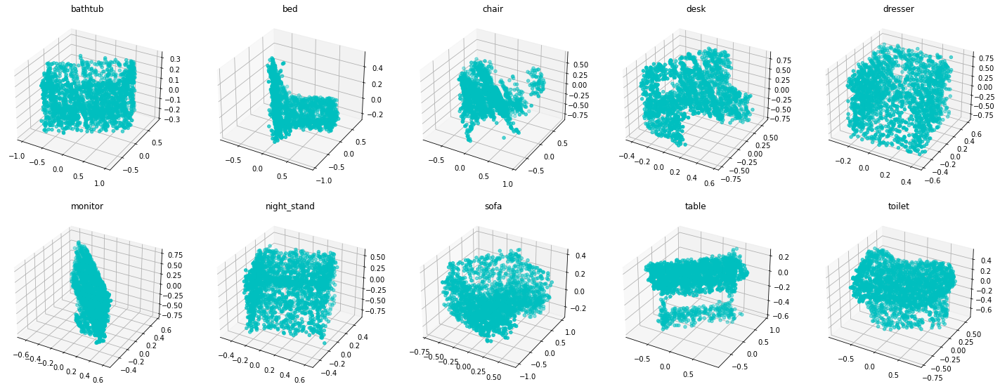

In [51]:
fig = plt.figure(figsize=(25, 25))
for i in range(10):
    ax = fig.add_subplot(5,5,i+1, projection='3d')
    s = criticos[i]
    # plot a 3D surface like in the example mplot3d/surface3d_demo
    surf = ax.scatter(s[0,:], s[1,:], s[2, :],color='c',marker='o',s=20)
    plt.title(class_names[i])
    # ==============

In [54]:
set_channels = 3
set_size = 2048
hidden_dim = 128
iters = 10
latent_dim = 64
lr = 0.001
iters = 10
inner_lr = 1
n_epochs = 50
set_encoder = FSEncoderDSPN(set_channels, latent_dim, hidden_dim)
set_decoder = DSPN(set_encoder, set_channels, set_size, hidden_dim, iters, inner_lr)
net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
model1 = net.set_decoder.encoder
optimizer = torch.optim.Adam([p for p in net.parameters() if p.requires_grad], lr=0.02)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Traning using ',device)
net.train()
print(net)
criticos = []
mask = torch.ones(342).float().unsqueeze(0)
#plotProgressCrit()
for  i, sample in enumerate(sampleSetDSPN):
    net = Net(input_encoder=None, set_encoder=set_encoder, set_decoder=set_decoder)
    optimizer = torch.optim.Adam([p for p in net.parameters() if p.requires_grad], lr=0.02)
    for epoch in range(100):
        model1 = net.set_decoder.encoder
        label = class_names2[i].unsqueeze(0)
        set = sampleSetDSPN[i]
        target_mask = sampleMaskDSPN[i]
        (progress, masks, evals, gradn), (y_enc, y_label) = net(label, set, target_mask)
        #criticos.append(critical_points_MaxEncoder(net.set_decoder.encoder.salidaConv,sampleSet[i]))
        progress_only = progress
        set = torch.cat([set, target_mask.unsqueeze(dim=1)], dim=1)
        progress = [torch.cat([p, m.unsqueeze(dim=1)], dim=1)
                        for p, m in zip(progress, masks)]
        #set_loss = hungarian_loss(
         #               progress[-1], set
         #           ).unsqueeze(0)
        set_loss = chamfer_loss(torch.stack(progress), set.unsqueeze(0))
        repr_loss = F.smooth_l1_loss(y_enc, y_label)
        #print("ojoo",repr_loss.item())
        loss = set_loss.mean() +  repr_loss.mean()
        
        progress = progress_only
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print("loss: ",round(loss.item(),5))
    criticos.append(progress_only[10].squeeze(0).detach().numpy())

Traning using  cpu
Net(
  (set_encoder): FSEncoderDSPN(
    (conv): Sequential(
      (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
      (1): ReLU()
      (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
      (3): ReLU()
      (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
    )
    (pool): FSPool()
  )
  (set_decoder): DSPN(
    (encoder): FSEncoderDSPN(
      (conv): Sequential(
        (0): Conv1d(4, 128, kernel_size=(1,), stride=(1,))
        (1): ReLU()
        (2): Conv1d(128, 128, kernel_size=(1,), stride=(1,))
        (3): ReLU()
        (4): Conv1d(128, 64, kernel_size=(1,), stride=(1,))
      )
      (pool): FSPool()
    )
  )
)
loss:  0.00064
loss:  0.00016
loss:  7e-05
loss:  0.00024
loss:  0.00026
loss:  0.0001
loss:  0.00018
loss:  0.00015
loss:  0.00015
loss:  0.0002


In [55]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Initialize figure with 4 3D subplots
fig = make_subplots(
    rows=2, cols=5,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'}],
           [{'type': 'scatter3d'}, {'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'},{'type': 'scatter3d'}]])
fig.add_trace(go.Scatter3d(x=criticos[0][0], y=criticos[0][1], z=criticos[0][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),                                      
                                       mode='markers') ,row=1, col=1)
fig.add_trace(go.Scatter3d(x=criticos[1][0], y=criticos[1][1], z=criticos[1][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=2)
fig.add_trace(go.Scatter3d(x=criticos[2][0], y=criticos[2][1], z=criticos[2][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=3)
fig.add_trace(go.Scatter3d(x=criticos[3][0], y=criticos[3][1], z=criticos[3][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=4)
fig.add_trace(go.Scatter3d(x=criticos[4][0], y=criticos[4][1], z=criticos[4][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=1, col=5)
fig.add_trace(go.Scatter3d(x=criticos[5][0], y=criticos[5][1], z=criticos[5][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=1)
fig.add_trace(go.Scatter3d(x=criticos[6][0], y=criticos[6][1], z=criticos[6][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=2)
fig.add_trace(go.Scatter3d(x=criticos[7][0], y=criticos[7][1], z=criticos[7][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=3)
fig.add_trace(go.Scatter3d(x=criticos[8][0], y=criticos[8][1], z=criticos[8][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=4)
fig.add_trace(go.Scatter3d(x=criticos[9][0], y=criticos[9][1], z=criticos[9][2],
                                       marker=dict(size=1,
                                      line=dict(width=1,
                                      color='navy'),color = 'rgb(125,125,125)'),
                                       mode='markers'), row=2, col=5)
fig.update_layout(
         showlegend=False,
         template="plotly_white",
     margin=dict(
        t=100
    ),
    hovermode='closest',    )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

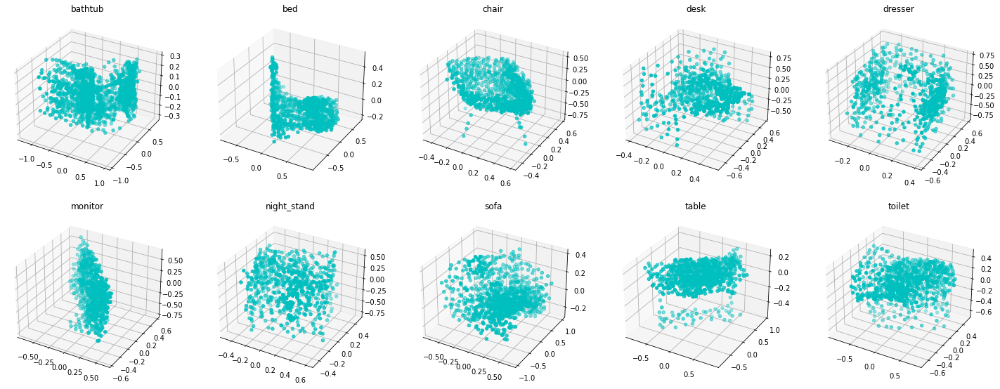

In [56]:
fig = plt.figure(figsize=(25, 25))
for i in range(10):
    ax = fig.add_subplot(5,5,i+1, projection='3d')
    s = criticos[i]
    # plot a 3D surface like in the example mplot3d/surface3d_demo
    surf = ax.scatter(s[0,:], s[1,:], s[2, :],color='c',marker='o',s=20)
    plt.title(class_names[i])
    # ==============